<a href="https://colab.research.google.com/github/keziah65/dsi30-projects/blob/main/Final_YOLOv5_Custom_Training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Capstone Project

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Custom Training with YOLOv5

We will assemble a dataset and train a custom YOLOv5 model to recognize the objects in our dataset. To do so we will take the following steps:

* Gather a dataset of images and label our dataset
* Export our dataset to YOLOv5
* Train YOLOv5 to recognize the objects in our dataset
* Evaluate our YOLOv5 model's performance
* Run test inference to view our model at work

# Step 1: Install Requirements

In [ ]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 12190, done.
remote: Counting objects: 100% (66/66), done.
remote: Compressing objects: 100% (61/61), done.
remote: Total 12190 (delta 31), reused 25 (delta 5), pack-reused 12124
Receiving objects: 100% (12190/12190), 12.58 MiB | 23.85 MiB/s, done.
Resolving deltas: 100% (8379/8379), done.
/content/yolov5
     |████████████████████████████████| 1.6 MB 4.2 MB/s 
     |████████████████████████████████| 145 kB 4.1 MB/s 
     |████████████████████████████████| 178 kB 43.2 MB/s 
     |████████████████████████████████| 1.1 MB 56.0 MB/s 
     |████████████████████████████████| 67 kB 6.0 MB/s 
     |████████████████████████████████| 54 kB 2.7 MB/s 
     |████████████████████████████████| 138 kB 76.8 MB/s 
     |████████████████████████████████| 62 kB 1.4 MB/s 
Setup complete. Using torch 1.12.1+cu113 (Tesla T4)


# Step 2: Assemble Our Dataset

In order to train our custom model, we need to assemble a dataset of representative images with bounding box annotations around the objects that we want to detect. And we need our dataset to be in YOLOv5 format.

In Roboflow, you can choose between two paths:

* Convert an existing dataset to YOLOv5 format. Roboflow supports over [30 formats object detection formats](https://roboflow.com/formats) for conversion.
* Upload raw images and annotate them in Roboflow with [Roboflow Annotate](https://docs.roboflow.com/annotate).

## Preprocessing

I performed the following preprocessing steps using the Roboflow API:
1. Train, validation,test split
*   70% train, 20% validation, 10% test split
*   The image dataset has to be stratified because there is an imbalance in the classes. Fortunately, roboflow handles the split with ease, making sure that each class is represented in the right amount.

2. Resize image
* YOLO requires square-aspect ratio input images, so the images are resized to be square images such as 320 x 320 or 640 x 640.

3. Image Augmentation
*   With the aid of image augmentation, the training set can be made larger and a less-than-ideal representation of each class's appearance can be obtained. I have selected 2 types of augmentation namely mosaic and shear bounding box (±15° Horizontal, ±15° Vertical).











In [ ]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [ ]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:
#after following the link above, recieve python code with these fields filled in

#rf = Roboflow(api_key="YOUR API KEY HERE")
#project = rf.workspace().project("YOUR PROJECT")
#dataset = project.version("YOUR VERSION").download("yolov5")

from roboflow import Roboflow
rf = Roboflow(api_key="YOUR API KEY HERE") #API key masked off
project = rf.workspace("dsi-iu9ho").project("face-mask-detection-svgaq")
dataset = project.version(5).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/Face-mask-detection-5 in yolov5pytorch:: 100%|██████████| 1708/1708 [00:00<00:00, 8163.51it/s]


Yolov5s model are ran a few times with the following variations:
1. **input image size 416 x 416 without augmentations** (without removing duplicate images)
- dataset = project.version(1).download("yolov5")
2. **input image size 640 x 640 with augmentations**
- dataset = project.version(2).download("yolov5")
3. **input image size 320 x 320 with augmentations**
- dataset = project.version(3).download("yolov5")
4. **input image size 640 x 640 without augmentations**
- dataset = project.version(4).download("yolov5")  
5. **input image size 320 x 320 without augmentations** 
- dataset = project.version(5).download("yolov5")

**Note**: Only one run of the model variation is shown in this notebook.

# Step 3: Train Our Custom YOLOv5 model
Yolov5 is a single stage object detector. Given that the region proposal and classification are completed in a single step, this indicates a quick inference time. The structure consists of 23 layers.

I chose yolov5s pre-trained weights because I want the object detector to be able to make inferences in real time. The "yolov5s" model offers a fast inference time with low computational requirements. Though pre-trained weights like "yolov5x" have a higher mAP score, they also have a higher computing cost and inference speed.


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [ ]:
!python train.py --img 416 --batch 32 --epochs 250 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/Face-mask-detection-5/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=250, batch_size=32, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-94-g1aea74c Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0

# Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

The metric that we want to focus on is `mAP_0.5` - learn more about mean average precision [here](https://blog.roboflow.com/mean-average-precision/).

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 717), started 3:01:49 ago. (Use '!kill 717' to kill it.)

<IPython.core.display.Javascript object>

We will be using mAP_0.5 as the evaluation meric. We can see from the tensorboard above the progress of the mAP score for each epoch step. The mAP score increases quickly before plateauing. Based on the mAP evaluation metric, it is clear that enabling larger input image sizes (such as 640x640 versus 320x320) and using image augmentation significantly improve the system's performance. The table below tabulates the final results using the best weights. 

|     **Models**     | **mAP_0.5** | **m_AP_0.5:0.95** |
|:------------------:|:-----------:|:-----------------:|
|     yolov5_416     |   0.82896   |      0.49641      |
| yolov5_640_augment |   0.97706   |      0.74817      |
| yolov5_320_augment |   0.95884   |      0.68944      |
|     yolov5_640     | 0.90891     |      0.57962      |
|     yolov5_320     | 0.87565     |      0.56838      |

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:
!python detect.py --weights runs/train/exp5/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp5/weights/best.pt'], source=/content/datasets/Face-mask-detection-5/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-94-g1aea74c Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/84 /content/datasets/Face-mask-detection-5/test/images/maksssksksss102_png.rf.81a87d71b99dba8184facebdc6e0d685.jpg: 416x416 3 with_masks, 1 without_mask, 8.4ms
image 2/84 /content/datasets/Face-mask-detection-5/test/images/maksssksksss106_png.rf.9c291b81c5e779a4b56c79e7ab0361c0.jpg: 416x416 1 with_mask, 1 

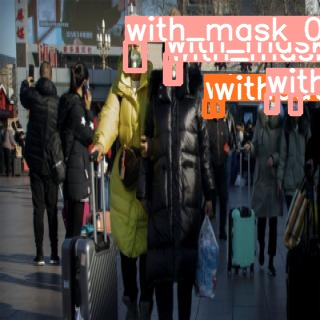

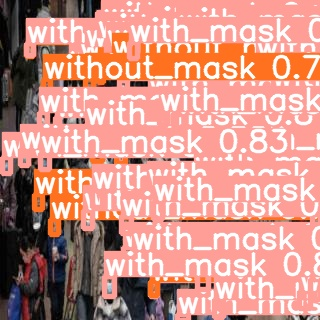

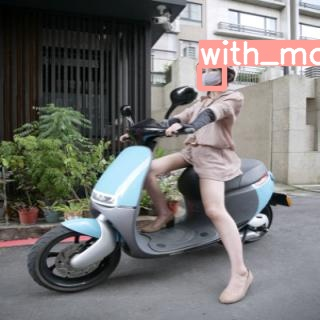

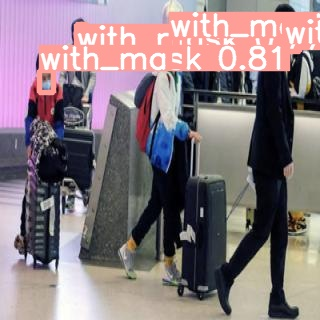

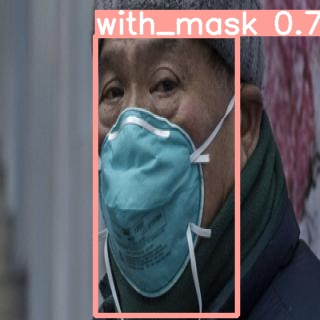

...

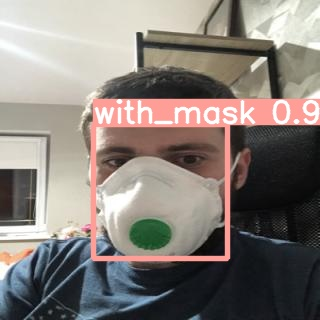

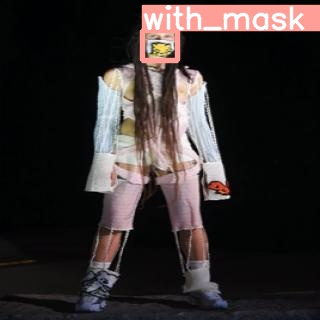

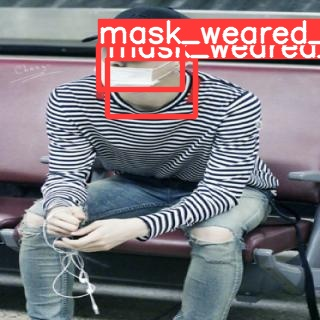

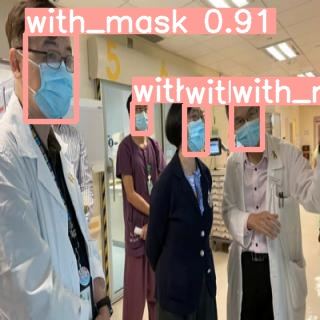

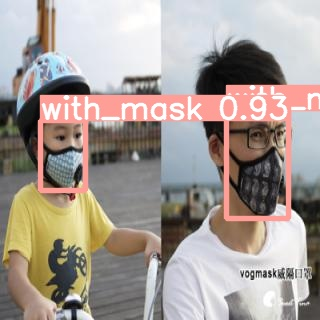

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp5/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Conclusion and Next Steps

Congratulations! You've trained a custom YOLOv5 model to recognize your custom objects.

To improve you model's performance, we recommend first interating on your datasets coverage and quality. See this guide for [model performance improvement](https://github.com/ultralytics/yolov5/wiki/Tips-for-Best-Training-Results).

To deploy your model to an application, see this guide on [exporting your model to deployment destinations](https://github.com/ultralytics/yolov5/issues/251).

Once your model is in production, you will want to continually iterate and improve on your dataset and model via [active learning](https://blog.roboflow.com/what-is-active-learning/).

In [ ]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp5/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!zip -r /content/datasets.zip /content/datasets

In [ ]:
files.download('/content/datasets.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!zip -r /content/runs.zip /content/yolov5/runs

In [ ]:
files.download('/content/yolov5/runs.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>